<a href="https://colab.research.google.com/github/Saket2310/Anime-Classification-using-CNN/blob/main/DRAFT_P9_32mlds.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore')

In [3]:
data=pd.read_csv('/content/drive/MyDrive/pokemon (3)/pokemon.csv')
data

,Name,Type1,Type2,Evolution
0,bulbasaur,Grass,Poison,ivysaur
1,ivysaur,Grass,Poison,venusaur
2,venusaur,Grass,Poison,NaN
3,charmander,Fire,NaN,charmeleon
4,charmeleon,Fire,NaN,charizard
...,...,...,...,...
804,stakataka,Rock,Steel,NaN
805,blacephalon,Fire,Ghost,NaN
806,zeraora,Electric,NaN,NaN
807,meltan,Steel,NaN,NaN


In [4]:
data.value_counts('Type1')

,count
Type1,
Water,114
Normal,105
Grass,78
Bug,72
Fire,53
Psychic,53
Rock,46
Electric,40
Poison,34


In [5]:
data=data[data.Type1.isin(['Water','Grass','Fire'])][['Name','Type1']]
data

,Name,Type1
0,bulbasaur,Grass
1,ivysaur,Grass
2,venusaur,Grass
3,charmander,Fire
4,charmeleon,Fire
...,...,...
778,bruxish,Water
786,tapu-bulu,Grass
787,tapu-fini,Water
797,kartana,Grass


In [6]:
print('Data shape',data.shape)
print('Number of unique names',data.Name.nunique())

Data shape (245, 2)
Number of unique names 245


In [7]:
import os
import pandas as pd
import cv2

image_df=[]

path_start='/content/drive/MyDrive/pokemon (3)/images'
for filename in os.listdir(path_start):
    if filename.endswith(".png"):
        image_name = filename.split('.')[0]

        image = cv2.imread(os.path.join(path_start, filename))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#         image_df=image_df.append({'Name':image_name,'img':np.array(image)},ignore_index=True)
#         image_df=pd.concat
        image_df.append({'Name':image_name,'img':np.array(image)})

image_df=pd.DataFrame(image_df)

In [8]:
data=data.merge(image_df,how='inner', on='Name')

In [9]:
data.img.info()

<class 'pandas.core.series.Series'>
RangeIndex: 245 entries, 0 to 244
Series name: img
Non-Null Count  Dtype 
--------------  ----- 
245 non-null    object
dtypes: object(1)
memory usage: 2.0+ KB


In [10]:
data.value_counts('Type1')

,count
Type1,
Water,114
Grass,78
Fire,53


In [11]:
data.loc[0].img.shape

(120, 120, 3)

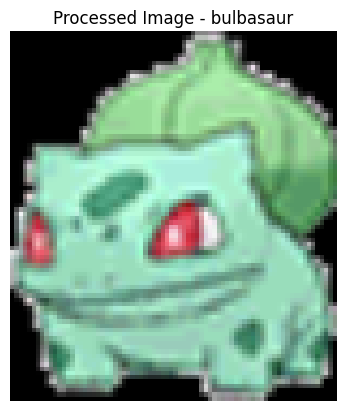

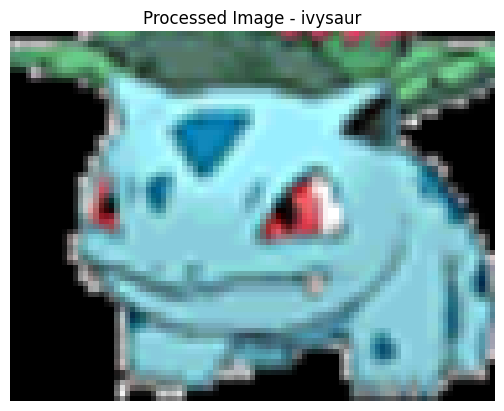

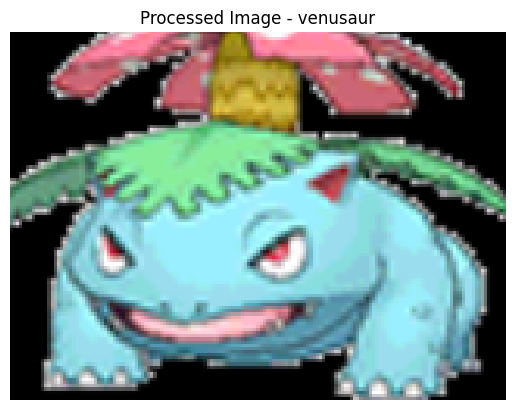

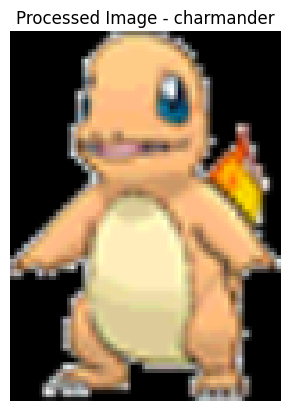

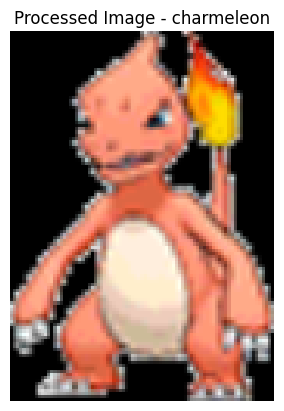

...

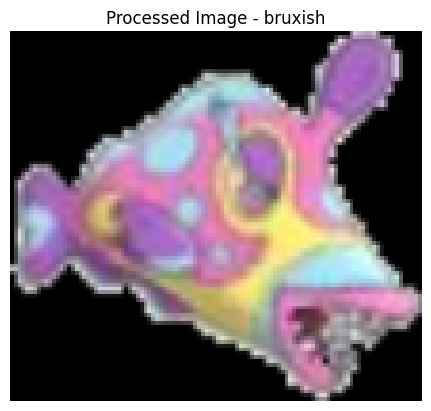

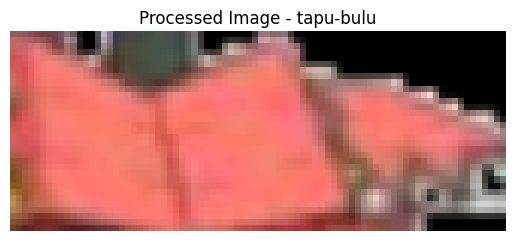

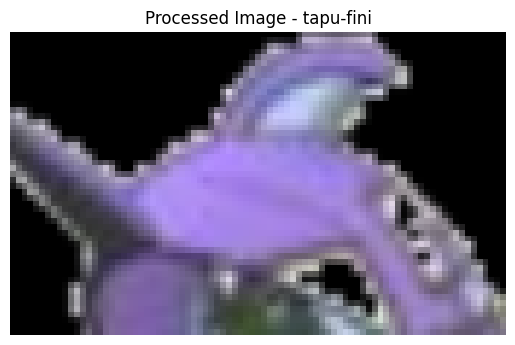

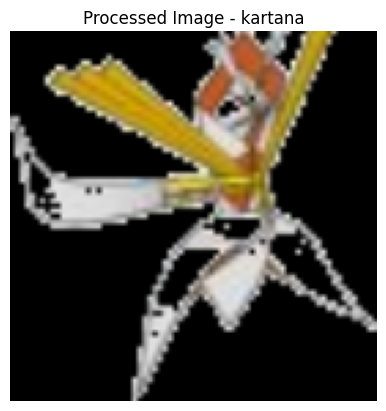

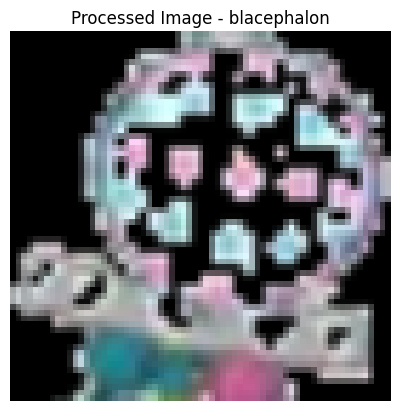

In [12]:
# prompt: give a code for preprocess the image in resizing removing background and show the image in result as output

import cv2
import numpy as np

def preprocess_image(image):
    # Resize the image
    resized_image = cv2.resize(image, (224, 224))  # Adjust size as needed

    # Remove background (example using simple thresholding)
    gray = cv2.cvtColor(resized_image, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)
        cropped_image = resized_image[y:y + h, x:x + w]

        #Handle cases where cropping results in an empty image
        if cropped_image.size == 0 :
          cropped_image = resized_image

    else:
        cropped_image = resized_image

    return cropped_image

# Example usage (assuming 'data' DataFrame from the provided code):
for index, row in data.iterrows():
    image = row['img']
    processed_image = preprocess_image(image)

    # Display the processed image
    plt.imshow(processed_image)
    plt.title(f"Processed Image - {row['Name']}")
    plt.axis('off')  # Hide axis ticks and labels
    plt.show()

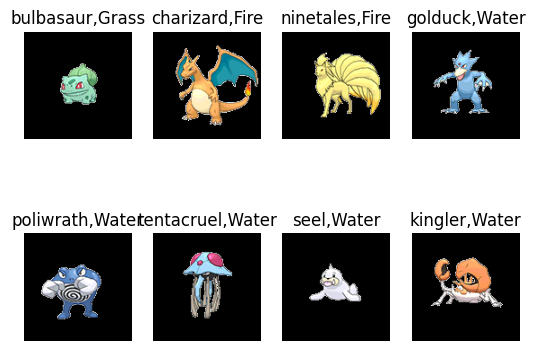

In [13]:
for i in range(8):
    plt.subplot(2, 4, i+1)
    plt.imshow(data.loc[i*5].img)
    plt.title(f"{data.loc[i*5].Name},{data.loc[i*5].Type1}")
    plt.axis('off')
plt.show()

In [14]:
from sklearn.model_selection import train_test_split
X=np.array(data['img'].tolist(), dtype = np.float32)/255.0
y=data['Type1']

In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img


datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)


augmented_images = []
augmented_labels = []


for i in range(len(X)):
    image = X[i]
    label = y[i]
    image = np.expand_dims(image, axis=0)
    label = np.array([label])
    augmented_images_batch, augmented_labels_batch = [], []
    j=0
    for x_batch, y_batch in datagen.flow(image, label, batch_size=4):
        augmented_images_batch.extend(x_batch)
        augmented_labels_batch.extend(y_batch)
        j+=1
        if j>3:
            break
    augmented_images.extend(augmented_images_batch)
    augmented_labels.extend(augmented_labels_batch)

augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

In [16]:
print(X.shape)
print(augmented_images.shape)

(245, 120, 120, 3)
(980, 120, 120, 3)


In [17]:
X=np.concatenate((X, augmented_images), axis=0)
y=np.concatenate((y,augmented_labels), axis=0)
print(X.shape)

(1225, 120, 120, 3)


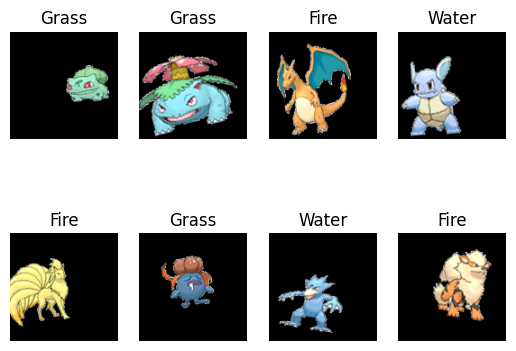

In [18]:
for i in range(8):
    plt.subplot(2, 4, i+1)
    plt.imshow(augmented_images[i*10])
    plt.title(f"{augmented_labels[i*10]}")
    plt.axis('off')
plt.show()

In [19]:
labels_dict={'Water': 0, 'Grass': 1, 'Fire': 2}


y_final = []
for yi in y:
    y_final.append(labels_dict[yi])


X_train, X_test, y_train, y_test=train_test_split(X,y_final, test_size=.2)

X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [21]:
cnn = models.Sequential([
    layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(120, 120, 3),kernel_regularizer=tf.keras.regularizers.l2(l=0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l=0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l=0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(3, activation='softmax')
])

TypeError: L2.__init__() got an unexpected keyword argument 'l'

In [22]:
cnn = models.Sequential([
    layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(120, 120, 3), kernel_regularizer=tf.keras.regularizers.l2(0.01)),  # Changed l=0.01 to 0.01
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),  # Changed l=0.01 to 0.01
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),  # Changed l=0.01 to 0.01
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(3, activation='softmax')
])

In [23]:
cnn = models.Sequential([
    layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(120, 120, 3), kernel_regularizer=tf.keras.regularizers.l2(0.01)), # Changed l=0.01 to 0.01
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)), # Changed l=0.01 to 0.01
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)), # Changed l=0.01 to 0.01
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(3, activation='softmax')
])

In [24]:
cnn.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
cnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 118, 118, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 59, 59, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 59, 59, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 57, 57, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 26, 26, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 13, 13, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 13, 13, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 21632)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       2,769,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 3)                   │             387 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,862,659 (10.92 MB)

 Trainable params: 2,862,659 (10.92 MB)

 Non-trainable params: 0 (0.00 B)

In [25]:
histor=cnn.fit(X_train, y_train, epochs=20, validation_data=(X_test,y_test))

Epoch 1/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.4266 - loss: 2.4731 - val_accuracy: 0.4245 - val_loss: 1.8024
Epoch 2/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 33s 937ms/step - accuracy: 0.4818 - loss: 1.6370 - val_accuracy: 0.5020 - val_loss: 1.3954
Epoch 3/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 28s 910ms/step - accuracy: 0.6092 - loss: 1.2416 - val_accuracy: 0.6245 - val_loss: 1.1455
Epoch 4/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.6779 - loss: 1.0025 - val_accuracy: 0.6939 - val_loss: 0.9749
Epoch 5/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 29s 953ms/step - accuracy: 0.7656 - loss: 0.8115 - val_accuracy: 0.7755 - val_loss: 0.8090
Epoch 6/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.8230 - loss: 0.6714 - val_accuracy: 0.7020 - val_loss: 0.8763
Epoch 7/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 30s 977ms/step - accuracy: 0.8057 - loss: 0.6677 - val_accuracy: 0.7673 - val_loss: 0.7764
Epoch 8/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 40s 950ms/step - accuracy: 0.8220 - loss: 0.5879 - val_accuracy: 0.7

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 208ms/step


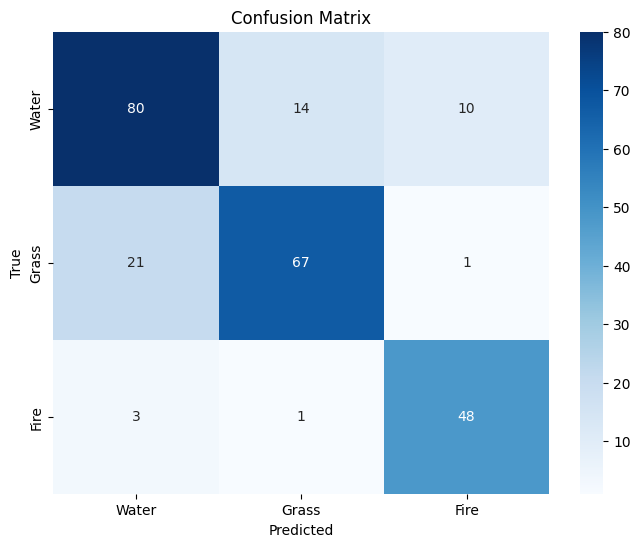

In [26]:
# create a confusion matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = cnn.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

cm = confusion_matrix(y_test, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Water', 'Grass', 'Fire'],
            yticklabels=['Water', 'Grass', 'Fire'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

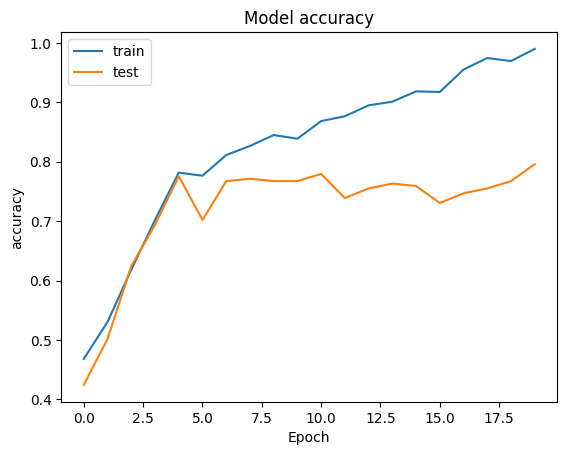

In [27]:
plt.plot(histor.history['accuracy'])
plt.plot(histor.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'])

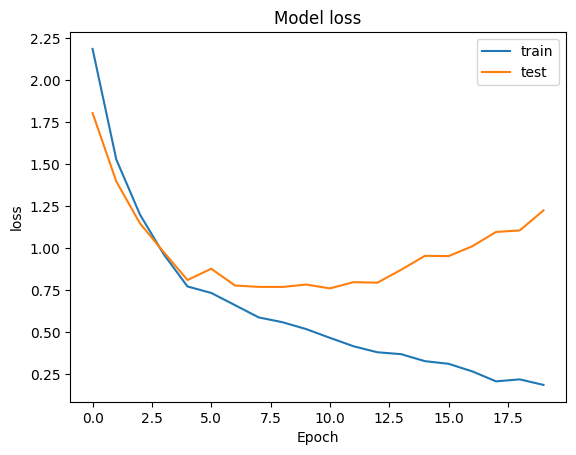

In [28]:
plt.plot(histor.history['loss'])
plt.plot(histor.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('loss')
plt.legend(['train', 'test'])

In [29]:
#  now make a new model as model 2

# Assuming the previous code is executed and the variables (X_train, y_train, etc.) are available.

cnn2 = models.Sequential([
    layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', input_shape=(120, 120, 3), kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),  # Increased dropout

    layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),  # Increased dropout

    layers.Conv2D(filters=256, kernel_size=(3, 3), activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)), # Added another convolutional layer
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3), # Increased dropout

    layers.Flatten(),
    layers.Dense(256, activation='relu'), # Increased dense layer units
    layers.Dense(3, activation='softmax')
])

cnn2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

cnn2.summary()

history2 = cnn2.fit(X_train, y_train, epochs=30, validation_data=(X_test, y_test)) # Increased epochs


y_pred2 = cnn2.predict(X_test)
y_pred_classes2 = np.argmax(y_pred2, axis=1)

cm2 = confusion_matrix(y_test, y_pred_classes2)



Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 118, 118, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 59, 59, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 59, 59, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 57, 57, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 26, 26, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 13, 13, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 13, 13, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 43264)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │      11,075,840 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 3)                   │             771 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,447,427 (43.67 MB)

 Trainable params: 11,447,427 (43.67 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.4583 - loss: 3.5320 - val_accuracy: 0.4245 - val_loss: 2.1449
Epoch 2/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.5228 - loss: 1.8626 - val_accuracy: 0.5510 - val_loss: 1.4785
Epoch 3/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - accuracy: 0.6540 - loss: 1.2728 - val_accuracy: 0.5592 - val_loss: 1.3609
Epoch 4/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 148s 3s/step - accuracy: 0.7179 - loss: 1.0072 - val_accuracy: 0.7265 - val_loss: 0.9102
Epoch 5/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 85s 3s/step - accuracy: 0.7814 - loss: 0.7955 - val_accuracy: 0.7878 - val_loss: 0.7838
Epoch 6/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 142s 3s/step - accuracy: 0.8114 - loss: 0.6862 - val_accuracy: 0.7714 - val_loss: 0.7681
Epoch 7/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.8318 - loss: 0.5980 - val_accuracy: 0.7796 - val_loss: 0.7017
Epoch 8/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - accuracy: 0.8597 - loss: 0.5346 - val_accuracy: 0.7714 - val_

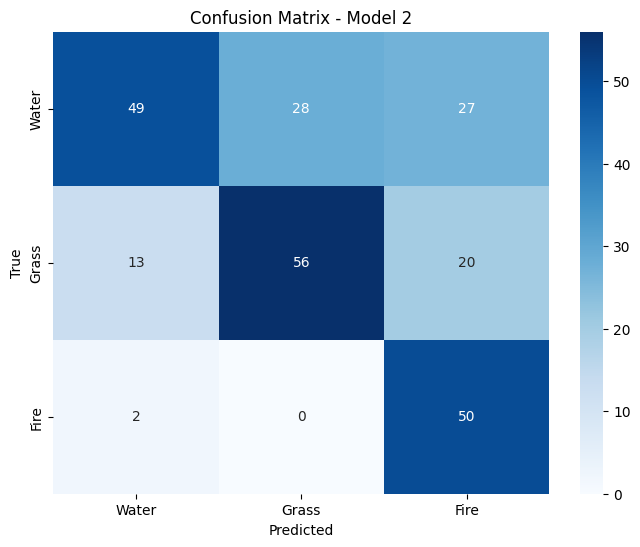

In [30]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Water', 'Grass', 'Fire'],
            yticklabels=['Water', 'Grass', 'Fire'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - Model 2')
plt.show()



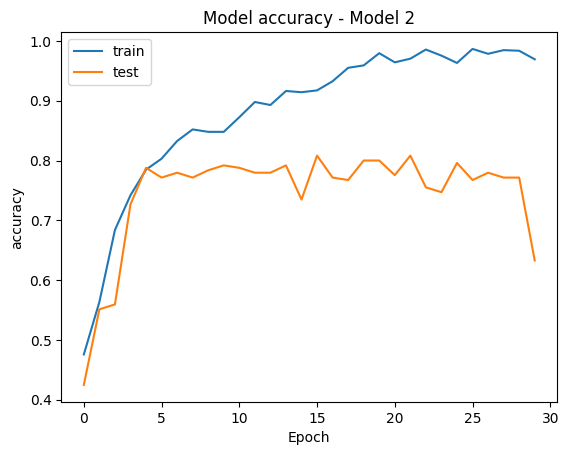

In [31]:

plt.plot(history2.history['accuracy'])
plt.plot(history2.history['val_accuracy'])
plt.title('Model accuracy - Model 2')
plt.xlabel('Epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'])
plt.show()

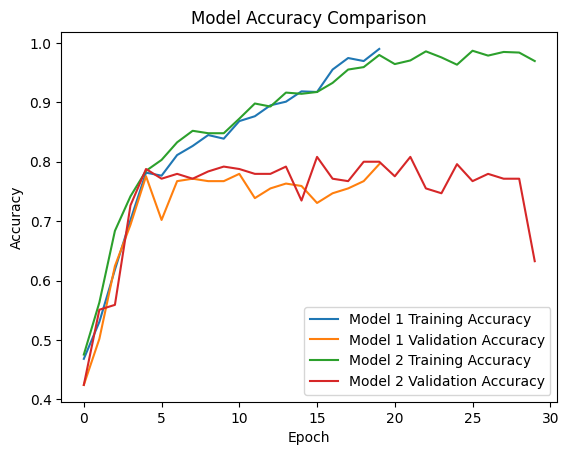

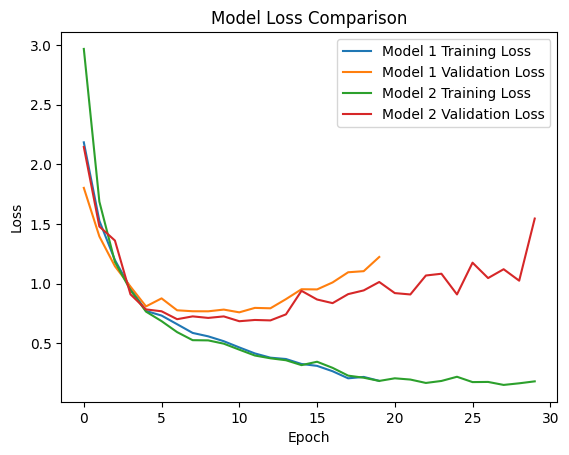

In [32]:
#  now compare the efficiency of both the model and plot graph

plt.plot(histor.history['accuracy'], label='Model 1 Training Accuracy')
plt.plot(histor.history['val_accuracy'], label='Model 1 Validation Accuracy')
plt.plot(history2.history['accuracy'], label='Model 2 Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Model 2 Validation Accuracy')
plt.title('Model Accuracy Comparison')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(histor.history['loss'], label='Model 1 Training Loss')
plt.plot(histor.history['val_loss'], label='Model 1 Validation Loss')
plt.plot(history2.history['loss'], label='Model 2 Training Loss')
plt.plot(history2.history['val_loss'], label='Model 2 Validation Loss')
plt.title('Model Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()